# 24. OpenCV vs LaMa vs Stable Diffusion Comparison

This notebook compares the three completed restoration baselines on the controlled 50-painting subset:

- OpenCV Telea,
- LaMa,
- Stable Diffusion Inpainting.

The comparison uses the shared restoration metadata and metric outputs generated by the model-specific notebooks.

The goal is to identify model-level differences across damage types, painting categories, metric families, and selected diagnostic cases.

## Comparison design

The comparison is case-paired by:

- `painting_id`,
- `mask_id`,
- `mask_type`,
- `case_id`.

The main local comparison uses:

- classical metrics from `masked_region`,
- LPIPS from `mask_bbox_crop`,
- CLIP/DINOv2 feature similarity from `mask_bbox_crop`.

This region policy matches the metric-specific assumptions used in the model reports.

The comparison focuses on the 200 non-zero damage cases. Zero-control cases are used for validation but excluded from model ranking because they contain no damaged pixels.

In [1]:
from pathlib import Path
import sys
import base64
from datetime import datetime

import pandas as pd
import yaml
from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import HTML, display

PROJECT_ROOT = Path.cwd().resolve()

if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

src_path = PROJECT_ROOT / "src"

if str(src_path) not in sys.path:
    sys.path.insert(0, str(src_path))

print("Project root:", PROJECT_ROOT)

Project root: D:\Masters\FH\Thesis\painting-restoration-eval


In [2]:
config_path = PROJECT_ROOT / "config" / "experiment_50_config.yaml"

if not config_path.exists():
    raise FileNotFoundError(f"Config file not found: {config_path}")

with open(config_path, "r", encoding="utf-8") as file:
    config = yaml.safe_load(file)

paths_cfg = config["paths"]

processed_metadata_dir = PROJECT_ROOT / paths_cfg["processed_metadata_dir"]
metrics_dir = PROJECT_ROOT / paths_cfg["metrics_dir"]
figures_dir = PROJECT_ROOT / paths_cfg["figures_dir"]
reports_dir = PROJECT_ROOT / paths_cfg.get("reports_dir", "outputs/reports")

metrics_dir.mkdir(parents=True, exist_ok=True)
figures_dir.mkdir(parents=True, exist_ok=True)
reports_dir.mkdir(parents=True, exist_ok=True)

comparison_metrics_dir = metrics_dir
comparison_figures_dir = figures_dir / "model_comparison" / "opencv_lama_stable_diffusion"
comparison_figures_dir.mkdir(parents=True, exist_ok=True)

comparison_report_path = reports_dir / "opencv_lama_stable_diffusion_comparison_report_50.html"

print("Metrics dir:", metrics_dir)
print("Comparison figures dir:", comparison_figures_dir)
print("Comparison report:", comparison_report_path)

Metrics dir: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics
Comparison figures dir: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\figures\model_comparison\opencv_lama_stable_diffusion
Comparison report: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_lama_stable_diffusion_comparison_report_50.html


In [4]:
model_registry = {
    "opencv_telea": {
        "display_name": "OpenCV Telea",
        "restored_metadata_path": processed_metadata_dir / "metadata_restored_opencv_telea.csv",
        "classical_metrics_path": metrics_dir / "classical_metrics_opencv_telea_50.csv",
        "lpips_metrics_path": metrics_dir / "lpips_metrics_opencv_telea_50.csv",
        "feature_metrics_path": metrics_dir / "feature_similarity_opencv_telea_50.csv",
    },
    "lama": {
        "display_name": "LaMa",
        "restored_metadata_path": processed_metadata_dir / "metadata_restored_lama.csv",
        "classical_metrics_path": metrics_dir / "classical_metrics_lama_50.csv",
        "lpips_metrics_path": metrics_dir / "lpips_metrics_lama_50.csv",
        "feature_metrics_path": metrics_dir / "feature_similarity_lama_50.csv",
    },
    "stable_diffusion_inpainting": {
        "display_name": "Stable Diffusion Inpainting",
        "restored_metadata_path": processed_metadata_dir / "metadata_restored_stable_diffusion.csv",
        "classical_metrics_path": metrics_dir / "classical_metrics_stable_diffusion_50.csv",
        "lpips_metrics_path": metrics_dir / "lpips_metrics_stable_diffusion_50.csv",
        "feature_metrics_path": metrics_dir / "feature_similarity_stable_diffusion_50.csv",
    },
}

output_paths = {
    "pairing": metrics_dir / "model_pairing_opencv_lama_stable_diffusion_50.csv",
    "classical_comparison": metrics_dir / "comparison_classical_opencv_lama_stable_diffusion_50.csv",
    "lpips_comparison": metrics_dir / "comparison_lpips_opencv_lama_stable_diffusion_50.csv",
    "feature_comparison": metrics_dir / "comparison_feature_similarity_opencv_lama_stable_diffusion_50.csv",
    "unified_local_comparison": metrics_dir / "comparison_unified_opencv_lama_stable_diffusion_50.csv",
    "summary_by_mask_type": metrics_dir / "comparison_summary_by_mask_type_opencv_lama_stable_diffusion_50.csv",
    "summary_by_category": metrics_dir / "comparison_summary_by_category_opencv_lama_stable_diffusion_50.csv",
    "win_rates": metrics_dir / "comparison_win_rates_opencv_lama_stable_diffusion_50.csv",
    "metric_disagreement_cases": metrics_dir / "comparison_metric_disagreement_cases_opencv_lama_stable_diffusion_50.csv",
    "visual_cases": metrics_dir / "comparison_visual_cases_opencv_lama_stable_diffusion_50.csv",
}

for model_name, model_info in model_registry.items():
    print("\nModel:", model_name)

    for key, path in model_info.items():
        if key == "display_name":
            continue

        print(f"  {key}: {path}")

        if not path.exists():
            raise FileNotFoundError(
                f"Missing input for {model_name}, {key}: {path}"
            )

print("\nAll registered model inputs exist.")


Model: opencv_telea
  restored_metadata_path: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\metadata\metadata_restored_opencv_telea.csv
  classical_metrics_path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\classical_metrics_opencv_telea_50.csv
  lpips_metrics_path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\lpips_metrics_opencv_telea_50.csv
  feature_metrics_path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\feature_similarity_opencv_telea_50.csv

Model: lama
  restored_metadata_path: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\metadata\metadata_restored_lama.csv
  classical_metrics_path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\classical_metrics_lama_50.csv
  lpips_metrics_path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\lpips_metrics_lama_50.csv
  feature_metrics_path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\feature_similarity_la

In [5]:
restoration_metadata = {}
classical_metrics = {}
lpips_metrics = {}
feature_metrics = {}

for model_name, model_info in model_registry.items():
    restoration_metadata[model_name] = pd.read_csv(model_info["restored_metadata_path"])
    classical_metrics[model_name] = pd.read_csv(model_info["classical_metrics_path"])
    lpips_metrics[model_name] = pd.read_csv(model_info["lpips_metrics_path"])
    feature_metrics[model_name] = pd.read_csv(model_info["feature_metrics_path"])

    print(f"\n{model_name}")
    print("  restoration:", restoration_metadata[model_name].shape)
    print("  classical:", classical_metrics[model_name].shape)
    print("  lpips:", lpips_metrics[model_name].shape)
    print("  feature:", feature_metrics[model_name].shape)


opencv_telea
  restoration: (250, 20)
  classical: (900, 30)
  lpips: (700, 24)
  feature: (700, 28)

lama
  restoration: (250, 32)
  classical: (900, 30)
  lpips: (700, 24)
  feature: (700, 28)

stable_diffusion_inpainting
  restoration: (250, 36)
  classical: (900, 30)
  lpips: (700, 24)
  feature: (700, 28)


In [6]:
expected_restoration_rows = 250
expected_classical_rows = 900
expected_feature_like_rows = 700

expected_restoration_mask_counts = {
    "loss_large": 50,
    "loss_small": 50,
    "mixed_damage": 50,
    "scratch_thin": 50,
    "zero_control": 50,
}

expected_classical_region_counts = {
    "full_image": 250,
    "content_region": 250,
    "masked_region": 200,
    "mask_bbox_crop": 200,
}

expected_feature_like_region_counts = {
    "full_image": 250,
    "content_region": 250,
    "mask_bbox_crop": 200,
}

for model_name in model_registry:
    restored_df = restoration_metadata[model_name]
    classical_df = classical_metrics[model_name]
    lpips_df = lpips_metrics[model_name]
    feature_df = feature_metrics[model_name]

    if len(restored_df) != expected_restoration_rows:
        raise ValueError(
            f"{model_name}: expected {expected_restoration_rows} restoration rows, "
            f"found {len(restored_df)}."
        )

    if len(classical_df) != expected_classical_rows:
        raise ValueError(
            f"{model_name}: expected {expected_classical_rows} classical rows, "
            f"found {len(classical_df)}."
        )

    if len(lpips_df) != expected_feature_like_rows:
        raise ValueError(
            f"{model_name}: expected {expected_feature_like_rows} LPIPS rows, "
            f"found {len(lpips_df)}."
        )

    if len(feature_df) != expected_feature_like_rows:
        raise ValueError(
            f"{model_name}: expected {expected_feature_like_rows} feature rows, "
            f"found {len(feature_df)}."
        )

    if "status" in restored_df.columns and (restored_df["status"] != "ok").any():
        display(restored_df[restored_df["status"] != "ok"])
        raise ValueError(f"{model_name}: restoration metadata contains non-ok rows.")

    for metric_name, metric_df in {
        "classical": classical_df,
        "lpips": lpips_df,
        "feature": feature_df,
    }.items():
        if "status" in metric_df.columns and (metric_df["status"] != "ok").any():
            display(metric_df[metric_df["status"] != "ok"])
            raise ValueError(f"{model_name}: {metric_name} metrics contain non-ok rows.")

    actual_mask_counts = restored_df["mask_type"].value_counts().to_dict()

    print("\n", model_name)
    print("Restoration mask counts:", actual_mask_counts)

    for mask_type, expected_count in expected_restoration_mask_counts.items():
        actual_count = actual_mask_counts.get(mask_type, 0)

        if actual_count != expected_count:
            raise ValueError(
                f"{model_name}: mask type {mask_type!r}: "
                f"expected {expected_count}, found {actual_count}."
            )

    actual_classical_region_counts = classical_df["evaluation_region"].value_counts().to_dict()

    for region, expected_count in expected_classical_region_counts.items():
        actual_count = actual_classical_region_counts.get(region, 0)

        if actual_count != expected_count:
            raise ValueError(
                f"{model_name}: classical region {region!r}: "
                f"expected {expected_count}, found {actual_count}."
            )

    for metric_name, metric_df in {
        "lpips": lpips_df,
        "feature": feature_df,
    }.items():
        actual_region_counts = metric_df["evaluation_region"].value_counts().to_dict()

        for region, expected_count in expected_feature_like_region_counts.items():
            actual_count = actual_region_counts.get(region, 0)

            if actual_count != expected_count:
                raise ValueError(
                    f"{model_name}: {metric_name} region {region!r}: "
                    f"expected {expected_count}, found {actual_count}."
                )

print("\nThree-model comparison input gates passed.")


 opencv_telea
Restoration mask counts: {'loss_large': 50, 'loss_small': 50, 'mixed_damage': 50, 'scratch_thin': 50, 'zero_control': 50}

 lama
Restoration mask counts: {'loss_large': 50, 'loss_small': 50, 'mixed_damage': 50, 'scratch_thin': 50, 'zero_control': 50}

 stable_diffusion_inpainting
Restoration mask counts: {'loss_large': 50, 'loss_small': 50, 'mixed_damage': 50, 'scratch_thin': 50, 'zero_control': 50}

Three-model comparison input gates passed.


In [7]:
pairing_key_columns = [
    "case_id",
    "painting_id",
    "mask_id",
    "mask_type",
]

metadata_display_columns = [
    "painting_id",
    "mask_id",
    "mask_type",
    "case_id",
]

pairing_tables = []

for model_name, restored_df in restoration_metadata.items():
    required_columns = pairing_key_columns + [
        "model_name",
        "clean_path",
        "damaged_path",
        "restored_path",
        "mask_path",
    ]

    missing_columns = [
        column for column in required_columns
        if column not in restored_df.columns
    ]

    if missing_columns:
        raise ValueError(
            f"{model_name}: restoration metadata missing columns: {missing_columns}"
        )

    model_pairing_df = restored_df[required_columns].copy()
    model_pairing_df["comparison_model"] = model_name

    pairing_tables.append(model_pairing_df)

long_pairing_df = pd.concat(pairing_tables, ignore_index=True)

pairing_count_df = (
    long_pairing_df
    .groupby(pairing_key_columns, dropna=False)
    .agg(model_count=("comparison_model", "nunique"))
    .reset_index()
)

if len(pairing_count_df) != 250:
    raise ValueError(
        f"Expected 250 unique paired cases, found {len(pairing_count_df)}."
    )

if (pairing_count_df["model_count"] != len(model_registry)).any():
    display(pairing_count_df[pairing_count_df["model_count"] != len(model_registry)])
    raise ValueError("Not all cases are present for all models.")

wide_pairing_df = pairing_count_df.copy()

for model_name in model_registry:
    model_paths_df = long_pairing_df[
        long_pairing_df["comparison_model"] == model_name
    ][
        pairing_key_columns
        + [
            "clean_path",
            "damaged_path",
            "restored_path",
            "mask_path",
        ]
    ].copy()

    model_paths_df = model_paths_df.rename(
        columns={
            "clean_path": f"{model_name}_clean_path",
            "damaged_path": f"{model_name}_damaged_path",
            "restored_path": f"{model_name}_restored_path",
            "mask_path": f"{model_name}_mask_path",
        }
    )

    wide_pairing_df = wide_pairing_df.merge(
        model_paths_df,
        on=pairing_key_columns,
        how="left",
        validate="one_to_one",
    )

wide_pairing_df.to_csv(output_paths["pairing"], index=False)

print("Long pairing rows:", len(long_pairing_df))
print("Wide pairing rows:", len(wide_pairing_df))
print("Saved pairing table:", output_paths["pairing"])

display(wide_pairing_df.head())

Long pairing rows: 750
Wide pairing rows: 250
Saved pairing table: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\model_pairing_opencv_lama_stable_diffusion_50.csv


,case_id,painting_id,mask_id,mask_type,model_count,opencv_telea_clean_path,opencv_telea_damaged_path,opencv_telea_restored_path,opencv_telea_mask_path,lama_clean_path,lama_damaged_path,lama_restored_path,lama_mask_path,stable_diffusion_inpainting_clean_path,stable_diffusion_inpainting_damaged_path,stable_diffusion_inpainting_restored_path,stable_diffusion_inpainting_mask_path
0,p001_loss_large,p001,p001_loss_large,loss_large,3,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,data/processed/restored/lama/p001_loss_large_r...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,data/processed/restored/stable_diffusion_inpai...,D:\Masters\FH\Thesis\painting-restoration-eval...
1,p001_loss_small,p001,p001_loss_small,loss_small,3,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,data/processed/restored/lama/p001_loss_small_r...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,data/processed/restored/stable_diffusion_inpai...,D:\Masters\FH\Thesis\painting-restoration-eval...
2,p001_mixed_damage,p001,p001_mixed_damage,mixed_damage,3,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,data/processed/restored/lama/p001_mixed_damage...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,data/processed/restored/stable_diffusion_inpai...,D:\Masters\FH\Thesis\painting-restoration-eval...
3,p001_scratch_thin,p001,p001_scratch_thin,scratch_thin,3,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,data/processed/restored/lama/p001_scratch_thin...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,data/processed/restored/stable_diffusion_inpai...,D:\Masters\FH\Thesis\painting-restoration-eval...
4,p001_zero_control,p001,p001_zero_control,zero_control,3,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,data/processed/restored/lama/p001_zero_control...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,data/processed/restored/stable_diffusion_inpai...,D:\Masters\FH\Thesis\painting-restoration-eval...


In [8]:
def find_single_column(df: pd.DataFrame, required_terms: list[str]) -> str:
    matches = []

    for column in df.columns:
        column_lower = column.lower()

        if all(term.lower() in column_lower for term in required_terms):
            matches.append(column)

    if len(matches) != 1:
        raise ValueError(
            f"Expected exactly one column matching terms {required_terms}, "
            f"found {len(matches)}: {matches}"
        )

    return matches[0]


metric_column_registry = {}

for model_name in model_registry:
    classical_df = classical_metrics[model_name]
    lpips_df = lpips_metrics[model_name]
    feature_df = feature_metrics[model_name]

    metric_column_registry[model_name] = {
        "classical": {
            "mse_improvement": find_single_column(classical_df, ["mse", "improvement"]),
            "psnr_improvement": find_single_column(classical_df, ["psnr", "improvement"]),
            "ssim_improvement": find_single_column(classical_df, ["ssim", "improvement"]),
        },
        "lpips": {
            "lpips_improvement": find_single_column(lpips_df, ["lpips", "improvement"]),
        },
        "feature": {
            "clip_improvement": find_single_column(feature_df, ["clip", "improvement"]),
            "dinov2_improvement": find_single_column(feature_df, ["dinov2", "improvement"]),
        },
    }

print("Detected metric columns:")

for model_name, families in metric_column_registry.items():
    print("\n", model_name)

    for family_name, columns in families.items():
        print(" ", family_name)

        for metric_name, column_name in columns.items():
            print(f"    {metric_name}: {column_name}")

Detected metric columns:

 opencv_telea
  classical
    mse_improvement: mse_improvement
    psnr_improvement: psnr_improvement
    ssim_improvement: ssim_improvement
  lpips
    lpips_improvement: lpips_improvement
  feature
    clip_improvement: clip_similarity_improvement
    dinov2_improvement: dinov2_similarity_improvement

 lama
  classical
    mse_improvement: mse_improvement
    psnr_improvement: psnr_improvement
    ssim_improvement: ssim_improvement
  lpips
    lpips_improvement: lpips_improvement
  feature
    clip_improvement: clip_similarity_improvement
    dinov2_improvement: dinov2_similarity_improvement

 stable_diffusion_inpainting
  classical
    mse_improvement: mse_improvement
    psnr_improvement: psnr_improvement
    ssim_improvement: ssim_improvement
  lpips
    lpips_improvement: lpips_improvement
  feature
    clip_improvement: clip_similarity_improvement
    dinov2_improvement: dinov2_similarity_improvement


In [9]:
def extract_local_model_metrics(model_name: str) -> pd.DataFrame:
    classical_df = classical_metrics[model_name].copy()
    lpips_df = lpips_metrics[model_name].copy()
    feature_df = feature_metrics[model_name].copy()

    classical_columns = metric_column_registry[model_name]["classical"]
    lpips_columns = metric_column_registry[model_name]["lpips"]
    feature_columns = metric_column_registry[model_name]["feature"]

    classical_local_df = classical_df[
        classical_df["evaluation_region"] == "masked_region"
    ].copy()

    lpips_local_df = lpips_df[
        lpips_df["evaluation_region"] == "mask_bbox_crop"
    ].copy()

    feature_local_df = feature_df[
        feature_df["evaluation_region"] == "mask_bbox_crop"
    ].copy()

    if len(classical_local_df) != 200:
        raise ValueError(
            f"{model_name}: expected 200 classical local rows, "
            f"found {len(classical_local_df)}."
        )

    if len(lpips_local_df) != 200:
        raise ValueError(
            f"{model_name}: expected 200 LPIPS local rows, "
            f"found {len(lpips_local_df)}."
        )

    if len(feature_local_df) != 200:
        raise ValueError(
            f"{model_name}: expected 200 feature local rows, "
            f"found {len(feature_local_df)}."
        )

    base_columns = [
        "case_id",
        "painting_id",
        "mask_id",
        "mask_type",
        "category",
        "title",
    ]

    missing_base_columns = [
        column for column in base_columns
        if column not in classical_local_df.columns
    ]

    if missing_base_columns:
        raise ValueError(
            f"{model_name}: classical local rows missing base columns: "
            f"{missing_base_columns}"
        )

    model_local_df = classical_local_df[
        base_columns
        + [
            classical_columns["mse_improvement"],
            classical_columns["psnr_improvement"],
            classical_columns["ssim_improvement"],
        ]
    ].copy()

    model_local_df = model_local_df.rename(
        columns={
            classical_columns["mse_improvement"]: f"{model_name}_mse_improvement",
            classical_columns["psnr_improvement"]: f"{model_name}_psnr_improvement",
            classical_columns["ssim_improvement"]: f"{model_name}_ssim_improvement",
        }
    )

    lpips_local_small_df = lpips_local_df[
        [
            "case_id",
            lpips_columns["lpips_improvement"],
        ]
    ].copy()

    lpips_local_small_df = lpips_local_small_df.rename(
        columns={
            lpips_columns["lpips_improvement"]: f"{model_name}_lpips_improvement",
        }
    )

    feature_local_small_df = feature_local_df[
        [
            "case_id",
            feature_columns["clip_improvement"],
            feature_columns["dinov2_improvement"],
        ]
    ].copy()

    feature_local_small_df = feature_local_small_df.rename(
        columns={
            feature_columns["clip_improvement"]: f"{model_name}_clip_improvement",
            feature_columns["dinov2_improvement"]: f"{model_name}_dinov2_improvement",
        }
    )

    model_local_df = (
        model_local_df
        .merge(lpips_local_small_df, on="case_id", how="inner", validate="one_to_one")
        .merge(feature_local_small_df, on="case_id", how="inner", validate="one_to_one")
    )

    if len(model_local_df) != 200:
        raise ValueError(
            f"{model_name}: expected 200 unified local rows, "
            f"found {len(model_local_df)}."
        )

    return model_local_df


model_local_tables = {
    model_name: extract_local_model_metrics(model_name)
    for model_name in model_registry
}

for model_name, model_local_df in model_local_tables.items():
    print(model_name, model_local_df.shape)
    display(model_local_df.head(2))

opencv_telea (200, 12)


,case_id,painting_id,mask_id,mask_type,category,title,opencv_telea_mse_improvement,opencv_telea_psnr_improvement,opencv_telea_ssim_improvement,opencv_telea_lpips_improvement,opencv_telea_clip_improvement,opencv_telea_dinov2_improvement
0,p001_loss_large,p001,p001_loss_large,loss_large,portrait_figure,Juan de Pareja,48015.951050,16.981299,NaN,0.318226,-0.002892,0.041827
1,p001_loss_small,p001,p001_loss_small,loss_small,portrait_figure,Juan de Pareja,46962.810768,31.576516,NaN,0.333183,0.088604,0.048946


lama (200, 12)


,case_id,painting_id,mask_id,mask_type,category,title,lama_mse_improvement,lama_psnr_improvement,lama_ssim_improvement,lama_lpips_improvement,lama_clip_improvement,lama_dinov2_improvement
0,p001_loss_large,p001,p001_loss_large,loss_large,portrait_figure,NaN,48703.631836,22.215740,NaN,0.444638,0.166787,0.253627
1,p001_loss_small,p001,p001_loss_small,loss_small,portrait_figure,NaN,46980.140714,34.856852,NaN,0.338072,0.089109,0.050690


stable_diffusion_inpainting (200, 12)


,case_id,painting_id,mask_id,mask_type,category,title,stable_diffusion_inpainting_mse_improvement,stable_diffusion_inpainting_psnr_improvement,stable_diffusion_inpainting_ssim_improvement,stable_diffusion_inpainting_lpips_improvement,stable_diffusion_inpainting_clip_improvement,stable_diffusion_inpainting_dinov2_improvement
0,p001_loss_large,p001,p001_loss_large,loss_large,portrait_figure,Juan de Pareja,48133.030640,17.532740,NaN,0.391132,0.119137,0.248403
1,p001_loss_small,p001,p001_loss_small,loss_small,portrait_figure,Juan de Pareja,46912.756538,27.543226,NaN,0.306002,0.071142,0.037632


In [11]:
identity_columns = [
    "case_id",
    "painting_id",
    "mask_id",
    "mask_type",
    "category",
]

metadata_columns = [
    "title",
]

model_names = list(model_registry.keys())

# Start from the first model and keep title as metadata, not as a merge key.
unified_local_df = model_local_tables[model_names[0]].copy()

# Ensure title is consistently string-like metadata.
if "title" in unified_local_df.columns:
    unified_local_df["title"] = unified_local_df["title"].fillna("").astype(str)

for model_name in model_names[1:]:
    model_table = model_local_tables[model_name].copy()

    if "title" in model_table.columns:
        model_table["title"] = model_table["title"].fillna("").astype(str)

    missing_identity_columns = [
        column for column in identity_columns
        if column not in model_table.columns
    ]

    if missing_identity_columns:
        raise ValueError(
            f"{model_name}: missing identity columns: {missing_identity_columns}"
        )

    model_metric_columns = [
        column
        for column in model_table.columns
        if column not in identity_columns + metadata_columns
    ]

    unified_local_df = unified_local_df.merge(
        model_table[identity_columns + model_metric_columns],
        on=identity_columns,
        how="inner",
        validate="one_to_one",
    )

if len(unified_local_df) != 200:
    raise ValueError(
        f"Expected 200 unified local comparison rows, found {len(unified_local_df)}."
    )

if unified_local_df["case_id"].duplicated().any():
    duplicated_cases = unified_local_df[
        unified_local_df["case_id"].duplicated(keep=False)
    ]
    display(duplicated_cases)
    raise ValueError("Unified local comparison contains duplicate case_id values.")

unified_local_df.to_csv(output_paths["unified_local_comparison"], index=False)

print("Unified local comparison rows:", len(unified_local_df))
print("Saved unified local comparison:", output_paths["unified_local_comparison"])

display(unified_local_df.head())

Unified local comparison rows: 200
Saved unified local comparison: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_unified_opencv_lama_stable_diffusion_50.csv


,case_id,painting_id,mask_id,mask_type,category,title,opencv_telea_mse_improvement,opencv_telea_psnr_improvement,opencv_telea_ssim_improvement,opencv_telea_lpips_improvement,...,lama_ssim_improvement,lama_lpips_improvement,lama_clip_improvement,lama_dinov2_improvement,stable_diffusion_inpainting_mse_improvement,stable_diffusion_inpainting_psnr_improvement,stable_diffusion_inpainting_ssim_improvement,stable_diffusion_inpainting_lpips_improvement,stable_diffusion_inpainting_clip_improvement,stable_diffusion_inpainting_dinov2_improvement
0,p001_loss_large,p001,p001_loss_large,loss_large,portrait_figure,Juan de Pareja,48015.951050,16.981299,NaN,0.318226,...,NaN,0.444638,0.166787,0.253627,48133.030640,17.532740,NaN,0.391132,0.119137,0.248403
1,p001_loss_small,p001,p001_loss_small,loss_small,portrait_figure,Juan de Pareja,46962.810768,31.576516,NaN,0.333183,...,NaN,0.338072,0.089109,0.050690,46912.756538,27.543226,NaN,0.306002,0.071142,0.037632
2,p001_mixed_damage,p001,p001_mixed_damage,mixed_damage,portrait_figure,Juan de Pareja,50520.931183,23.633919,NaN,0.385844,...,NaN,0.391770,0.102389,0.197233,49826.728882,17.444243,NaN,0.244464,0.060504,0.167937
3,p001_scratch_thin,p001,p001_scratch_thin,scratch_thin,portrait_figure,Juan de Pareja,48335.436569,24.474660,NaN,0.419886,...,NaN,0.420297,0.141728,0.074596,42301.111328,8.929056,NaN,0.161720,0.043441,-0.005591
4,p002_loss_large,p002,p002_loss_large,loss_large,portrait_figure,Madame X (Madame Pierre Gautreau),50914.557739,22.108130,NaN,0.387116,...,NaN,0.448236,0.245552,0.172309,50524.246399,18.609613,NaN,0.407476,0.222473,0.119677


In [12]:
comparison_metrics = {
    "mse_improvement": {
        "higher_is_better": True,
        "description": "Classical masked-region MSE improvement",
    },
    "psnr_improvement": {
        "higher_is_better": True,
        "description": "Classical masked-region PSNR improvement",
    },
    "ssim_improvement": {
        "higher_is_better": True,
        "description": "Classical masked-region SSIM improvement",
    },
    "lpips_improvement": {
        "higher_is_better": True,
        "description": "Mask-bounding-box LPIPS improvement",
    },
    "clip_improvement": {
        "higher_is_better": True,
        "description": "Mask-bounding-box CLIP similarity improvement",
    },
    "dinov2_improvement": {
        "higher_is_better": True,
        "description": "Mask-bounding-box DINOv2 similarity improvement",
    },
}

model_names = list(model_registry.keys())


def metric_column_for_model(model_name: str, metric_name: str) -> str:
    return f"{model_name}_{metric_name}"


def determine_metric_winner(row: pd.Series, metric_name: str) -> str:
    values = {}

    for model_name in model_names:
        column_name = metric_column_for_model(model_name, metric_name)

        if column_name not in row.index:
            raise ValueError(f"Missing metric column: {column_name}")

        value = row[column_name]

        if pd.notna(value):
            values[model_name] = value

    if not values:
        return "no_valid_values"

    max_value = max(values.values())

    winners = [
        model_name
        for model_name, value in values.items()
        if value == max_value
    ]

    if len(winners) == len(values):
        return "tie_all"

    if len(winners) > 1:
        return "tie_" + "_".join(sorted(winners))

    return winners[0]


def count_model_wins(row: pd.Series) -> pd.Series:
    win_counts = {
        f"{model_name}_metric_wins": 0
        for model_name in model_names
    }

    tie_count = 0

    for metric_name in comparison_metrics:
        winner = row[f"winner_{metric_name}"]

        if winner in model_names:
            win_counts[f"{winner}_metric_wins"] += 1
        else:
            tie_count += 1

    win_counts["metric_ties"] = tie_count

    max_wins = max(
        win_counts[f"{model_name}_metric_wins"]
        for model_name in model_names
    )

    top_models = [
        model_name
        for model_name in model_names
        if win_counts[f"{model_name}_metric_wins"] == max_wins
    ]

    if len(top_models) == 1 and max_wins > 0:
        win_counts["overall_metric_vote"] = top_models[0]
    elif max_wins == 0:
        win_counts["overall_metric_vote"] = "all_tie_or_no_winner"
    else:
        win_counts["overall_metric_vote"] = "tie_" + "_".join(sorted(top_models))

    return pd.Series(win_counts)


print("Comparison metrics:")
for metric_name, info in comparison_metrics.items():
    print(f"- {metric_name}: {info['description']}")

Comparison metrics:
- mse_improvement: Classical masked-region MSE improvement
- psnr_improvement: Classical masked-region PSNR improvement
- ssim_improvement: Classical masked-region SSIM improvement
- lpips_improvement: Mask-bounding-box LPIPS improvement
- clip_improvement: Mask-bounding-box CLIP similarity improvement
- dinov2_improvement: Mask-bounding-box DINOv2 similarity improvement


In [13]:
comparison_df = unified_local_df.copy()

for metric_name in comparison_metrics:
    for model_name in model_names:
        column_name = metric_column_for_model(model_name, metric_name)

        if column_name not in comparison_df.columns:
            raise ValueError(f"Missing comparison metric column: {column_name}")

    comparison_df[f"winner_{metric_name}"] = comparison_df.apply(
        lambda row: determine_metric_winner(row, metric_name),
        axis=1,
    )

win_count_df = comparison_df.apply(count_model_wins, axis=1)

comparison_df = pd.concat(
    [
        comparison_df,
        win_count_df,
    ],
    axis=1,
)

comparison_df["mixed_metric_outcome"] = (
    comparison_df[[f"winner_{metric_name}" for metric_name in comparison_metrics]]
    .nunique(axis=1)
    > 1
)

comparison_df["all_metrics_same_winner"] = (
    comparison_df[[f"winner_{metric_name}" for metric_name in comparison_metrics]]
    .nunique(axis=1)
    == 1
)

for model_name in model_names:
    comparison_df[f"{model_name}_all_metrics_win"] = (
        comparison_df[[f"winner_{metric_name}" for metric_name in comparison_metrics]]
        .eq(model_name)
        .all(axis=1)
    )

comparison_df.to_csv(output_paths["unified_local_comparison"], index=False)

print("Three-model unified comparison rows:", len(comparison_df))
print("Saved unified comparison:", output_paths["unified_local_comparison"])

display(
    comparison_df[
        [
            "case_id",
            "category",
            "mask_type",
            *[f"winner_{metric_name}" for metric_name in comparison_metrics],
            *[f"{model_name}_metric_wins" for model_name in model_names],
            "metric_ties",
            "overall_metric_vote",
            "mixed_metric_outcome",
        ]
    ].head()
)

Three-model unified comparison rows: 200
Saved unified comparison: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_unified_opencv_lama_stable_diffusion_50.csv


,case_id,category,mask_type,winner_mse_improvement,winner_psnr_improvement,winner_ssim_improvement,winner_lpips_improvement,winner_clip_improvement,winner_dinov2_improvement,opencv_telea_metric_wins,lama_metric_wins,stable_diffusion_inpainting_metric_wins,metric_ties,overall_metric_vote,mixed_metric_outcome
0,p001_loss_large,portrait_figure,loss_large,lama,lama,no_valid_values,lama,lama,lama,0,5,0,1,lama,True
1,p001_loss_small,portrait_figure,loss_small,lama,lama,no_valid_values,lama,lama,lama,0,5,0,1,lama,True
2,p001_mixed_damage,portrait_figure,mixed_damage,opencv_telea,opencv_telea,no_valid_values,lama,lama,lama,2,3,0,1,lama,True
3,p001_scratch_thin,portrait_figure,scratch_thin,lama,lama,no_valid_values,lama,lama,lama,0,5,0,1,lama,True
4,p002_loss_large,portrait_figure,loss_large,lama,lama,no_valid_values,lama,lama,lama,0,5,0,1,lama,True


In [14]:
classical_comparison_columns = [
    "case_id",
    "painting_id",
    "mask_id",
    "mask_type",
    "category",
    "title",
]

for model_name in model_names:
    classical_comparison_columns.extend(
        [
            f"{model_name}_mse_improvement",
            f"{model_name}_psnr_improvement",
            f"{model_name}_ssim_improvement",
        ]
    )

classical_comparison_columns.extend(
    [
        "winner_mse_improvement",
        "winner_psnr_improvement",
        "winner_ssim_improvement",
    ]
)

lpips_comparison_columns = [
    "case_id",
    "painting_id",
    "mask_id",
    "mask_type",
    "category",
    "title",
]

for model_name in model_names:
    lpips_comparison_columns.append(f"{model_name}_lpips_improvement")

lpips_comparison_columns.append("winner_lpips_improvement")

feature_comparison_columns = [
    "case_id",
    "painting_id",
    "mask_id",
    "mask_type",
    "category",
    "title",
]

for model_name in model_names:
    feature_comparison_columns.extend(
        [
            f"{model_name}_clip_improvement",
            f"{model_name}_dinov2_improvement",
        ]
    )

feature_comparison_columns.extend(
    [
        "winner_clip_improvement",
        "winner_dinov2_improvement",
    ]
)

comparison_df[classical_comparison_columns].to_csv(
    output_paths["classical_comparison"],
    index=False,
)

comparison_df[lpips_comparison_columns].to_csv(
    output_paths["lpips_comparison"],
    index=False,
)

comparison_df[feature_comparison_columns].to_csv(
    output_paths["feature_comparison"],
    index=False,
)

print("Saved family-specific comparison files:")
print(output_paths["classical_comparison"])
print(output_paths["lpips_comparison"])
print(output_paths["feature_comparison"])

Saved family-specific comparison files:
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_classical_opencv_lama_stable_diffusion_50.csv
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_lpips_opencv_lama_stable_diffusion_50.csv
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_feature_similarity_opencv_lama_stable_diffusion_50.csv


In [15]:
summary_agg = {
    "cases": ("case_id", "count"),
    "mean_metric_ties": ("metric_ties", "mean"),
}

for model_name in model_names:
    summary_agg[f"mean_{model_name}_metric_wins"] = (
        f"{model_name}_metric_wins",
        "mean",
    )

for metric_name in comparison_metrics:
    for model_name in model_names:
        summary_agg[f"mean_{model_name}_{metric_name}"] = (
            f"{model_name}_{metric_name}",
            "mean",
        )

summary_by_mask_type_df = (
    comparison_df
    .groupby("mask_type", dropna=False)
    .agg(**summary_agg)
    .reset_index()
    .sort_values("mask_type")
)

summary_by_category_df = (
    comparison_df
    .groupby("category", dropna=False)
    .agg(**summary_agg)
    .reset_index()
    .sort_values("category")
)

summary_by_mask_type_df.to_csv(
    output_paths["summary_by_mask_type"],
    index=False,
)

summary_by_category_df.to_csv(
    output_paths["summary_by_category"],
    index=False,
)

print("Summary by mask type:")
display(summary_by_mask_type_df)

print("\nSummary by category:")
display(summary_by_category_df)

print("\nSaved summaries:")
print(output_paths["summary_by_mask_type"])
print(output_paths["summary_by_category"])

Summary by mask type:


,mask_type,cases,mean_metric_ties,mean_opencv_telea_metric_wins,mean_lama_metric_wins,mean_stable_diffusion_inpainting_metric_wins,mean_opencv_telea_mse_improvement,mean_lama_mse_improvement,mean_stable_diffusion_inpainting_mse_improvement,mean_opencv_telea_psnr_improvement,...,mean_stable_diffusion_inpainting_ssim_improvement,mean_opencv_telea_lpips_improvement,mean_lama_lpips_improvement,mean_stable_diffusion_inpainting_lpips_improvement,mean_opencv_telea_clip_improvement,mean_lama_clip_improvement,mean_stable_diffusion_inpainting_clip_improvement,mean_opencv_telea_dinov2_improvement,mean_lama_dinov2_improvement,mean_stable_diffusion_inpainting_dinov2_improvement
0,loss_large,50,1.0,0.28,4.34,0.38,23999.733308,24555.375813,23124.429134,12.615486,...,NaN,0.185879,0.307958,0.221407,0.026314,0.158192,0.106688,-0.122129,0.135501,0.039577
1,loss_small,50,1.0,0.44,4.56,0.00,25902.881564,26147.753708,25636.699247,17.393119,...,NaN,0.166526,0.182632,0.108700,0.098812,0.103704,0.073849,0.057932,0.078849,0.020351
2,mixed_damage,50,1.0,0.20,4.80,0.00,26381.819261,26669.089760,25735.033149,15.395991,...,NaN,0.264452,0.290510,0.188334,0.132395,0.149796,0.104924,0.172798,0.231918,0.110759
3,scratch_thin,50,1.0,1.96,3.04,0.00,28319.668946,28387.473466,25670.202737,20.491108,...,NaN,0.256587,0.258198,0.131230,0.101158,0.101232,0.048619,0.147648,0.146852,0.018038



Summary by category:


,category,cases,mean_metric_ties,mean_opencv_telea_metric_wins,mean_lama_metric_wins,mean_stable_diffusion_inpainting_metric_wins,mean_opencv_telea_mse_improvement,mean_lama_mse_improvement,mean_stable_diffusion_inpainting_mse_improvement,mean_opencv_telea_psnr_improvement,...,mean_stable_diffusion_inpainting_ssim_improvement,mean_opencv_telea_lpips_improvement,mean_lama_lpips_improvement,mean_stable_diffusion_inpainting_lpips_improvement,mean_opencv_telea_clip_improvement,mean_lama_clip_improvement,mean_stable_diffusion_inpainting_clip_improvement,mean_opencv_telea_dinov2_improvement,mean_lama_dinov2_improvement,mean_stable_diffusion_inpainting_dinov2_improvement
0,abstraction_surrealism,40,1.0,0.750,4.075,0.175,18899.959899,19484.237353,17876.773131,12.663342,...,NaN,0.139129,0.166960,0.105644,0.065088,0.087756,0.063532,0.026611,0.091159,0.014449
1,architecture_structured,40,1.0,0.925,4.000,0.075,25406.392617,25722.202983,24537.514644,17.020632,...,NaN,0.238820,0.287507,0.188694,0.111361,0.151707,0.095640,0.033980,0.103146,0.008588
2,high_texture_brushwork,40,1.0,0.650,4.225,0.125,26778.382584,26948.319574,25769.689114,17.441999,...,NaN,0.236506,0.276681,0.173777,0.091352,0.140614,0.099730,0.093131,0.175133,0.103444
3,landscape_natural,40,1.0,0.825,4.150,0.025,21573.904087,21766.124514,20384.583746,15.243420,...,NaN,0.207191,0.263705,0.136462,0.090349,0.138341,0.069364,0.087183,0.229342,0.045523
4,portrait_figure,40,1.0,0.450,4.475,0.075,38096.489662,38278.731508,36639.394696,20.000236,...,NaN,0.270158,0.304269,0.207513,0.090200,0.122736,0.089334,0.079405,0.142620,0.063903



Saved summaries:
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_summary_by_mask_type_opencv_lama_stable_diffusion_50.csv
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_summary_by_category_opencv_lama_stable_diffusion_50.csv


In [16]:
winner_rows = []

for metric_name, metric_info in comparison_metrics.items():
    winner_counts = comparison_df[f"winner_{metric_name}"].value_counts(dropna=False)

    for winner_name, count in winner_counts.items():
        winner_rows.append(
            {
                "metric_name": metric_name,
                "metric_description": metric_info["description"],
                "winner": winner_name,
                "cases": int(count),
                "case_fraction": count / len(comparison_df),
            }
        )

overall_vote_counts = comparison_df["overall_metric_vote"].value_counts(dropna=False)

for winner_name, count in overall_vote_counts.items():
    winner_rows.append(
        {
            "metric_name": "overall_metric_vote",
            "metric_description": "Per-case majority vote across six local metrics",
            "winner": winner_name,
            "cases": int(count),
            "case_fraction": count / len(comparison_df),
        }
    )

win_rates_df = pd.DataFrame(winner_rows)

win_rates_df.to_csv(
    output_paths["win_rates"],
    index=False,
)

print("Three-model win rates:")
display(win_rates_df)

print("Saved win rates:")
print(output_paths["win_rates"])

Three-model win rates:


,metric_name,metric_description,winner,cases,case_fraction
0,mse_improvement,Classical masked-region MSE improvement,lama,159,0.795
1,mse_improvement,Classical masked-region MSE improvement,opencv_telea,40,0.200
2,mse_improvement,Classical masked-region MSE improvement,stable_diffusion_inpainting,1,0.005
3,psnr_improvement,Classical masked-region PSNR improvement,lama,159,0.795
4,psnr_improvement,Classical masked-region PSNR improvement,opencv_telea,40,0.200
5,psnr_improvement,Classical masked-region PSNR improvement,stable_diffusion_inpainting,1,0.005
6,ssim_improvement,Classical masked-region SSIM improvement,no_valid_values,200,1.000
7,lpips_improvement,Mask-bounding-box LPIPS improvement,lama,182,0.910
8,lpips_improvement,Mask-bounding-box LPIPS improvement,opencv_telea,12,0.060
9,lpips_improvement,Mask-bounding-box LPIPS improvement,stable_diffusion_inpainting,6,0.030


Saved win rates:
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_win_rates_opencv_lama_stable_diffusion_50.csv


In [17]:
winner_columns = [
    f"winner_{metric_name}"
    for metric_name in comparison_metrics
]

metric_disagreement_cases_df = comparison_df[
    comparison_df["mixed_metric_outcome"]
].copy()

metric_disagreement_cases_df["num_unique_metric_winners"] = (
    metric_disagreement_cases_df[winner_columns]
    .nunique(axis=1)
)

metric_disagreement_cases_df["max_model_metric_wins"] = metric_disagreement_cases_df[
    [f"{model_name}_metric_wins" for model_name in model_names]
].max(axis=1)

metric_disagreement_cases_df["disagreement_strength"] = (
    metric_disagreement_cases_df["num_unique_metric_winners"]
    + metric_disagreement_cases_df["metric_ties"]
)

metric_disagreement_cases_df = (
    metric_disagreement_cases_df
    .sort_values(
        [
            "disagreement_strength",
            "num_unique_metric_winners",
            "metric_ties",
        ],
        ascending=[False, False, False],
    )
    .reset_index(drop=True)
)

metric_disagreement_cases_df.to_csv(
    output_paths["metric_disagreement_cases"],
    index=False,
)

print("Metric-disagreement cases:", len(metric_disagreement_cases_df))
print("Saved metric-disagreement cases:", output_paths["metric_disagreement_cases"])

display(
    metric_disagreement_cases_df[
        [
            "case_id",
            "category",
            "mask_type",
            "overall_metric_vote",
            "num_unique_metric_winners",
            "disagreement_strength",
            *winner_columns,
            *[f"{model_name}_metric_wins" for model_name in model_names],
            "metric_ties",
        ]
    ].head(30)
)

Metric-disagreement cases: 200
Saved metric-disagreement cases: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_metric_disagreement_cases_opencv_lama_stable_diffusion_50.csv


,case_id,category,mask_type,overall_metric_vote,num_unique_metric_winners,disagreement_strength,winner_mse_improvement,winner_psnr_improvement,winner_ssim_improvement,winner_lpips_improvement,winner_clip_improvement,winner_dinov2_improvement,opencv_telea_metric_wins,lama_metric_wins,stable_diffusion_inpainting_metric_wins,metric_ties
0,p040_loss_large,abstraction_surrealism,loss_large,tie_lama_opencv_telea,4,5,opencv_telea,opencv_telea,no_valid_values,lama,stable_diffusion_inpainting,lama,2,2,1,1
1,p001_mixed_damage,portrait_figure,mixed_damage,lama,3,4,opencv_telea,opencv_telea,no_valid_values,lama,lama,lama,2,3,0,1
2,p002_scratch_thin,portrait_figure,scratch_thin,lama,3,4,lama,lama,no_valid_values,lama,opencv_telea,lama,1,4,0,1
3,p004_scratch_thin,portrait_figure,scratch_thin,lama,3,4,lama,lama,no_valid_values,lama,opencv_telea,opencv_telea,2,3,0,1
4,p005_loss_large,portrait_figure,loss_large,lama,3,4,opencv_telea,opencv_telea,no_valid_values,lama,lama,lama,2,3,0,1
5,p007_loss_large,portrait_figure,loss_large,lama,3,4,lama,lama,no_valid_values,lama,stable_diffusion_inpainting,lama,0,4,1,1
6,p007_scratch_thin,portrait_figure,scratch_thin,lama,3,4,lama,lama,no_valid_values,lama,opencv_telea,lama,1,4,0,1
7,p008_scratch_thin,portrait_figure,scratch_thin,lama,3,4,lama,lama,no_valid_values,lama,lama,opencv_telea,1,4,0,1
8,p009_loss_large,portrait_figure,loss_large,lama,3,4,lama,lama,no_valid_values,lama,stable_diffusion_inpainting,stable_diffusion_inpainting,0,3,2,1
9,p009_scratch_thin,portrait_figure,scratch_thin,opencv_telea,3,4,opencv_telea,opencv_telea,no_valid_values,lama,lama,opencv_telea,3,2,0,1


In [18]:
visual_selection_frames = []

# Strongest majority-vote cases per model.
for model_name in model_names:
    model_majority_df = comparison_df[
        comparison_df["overall_metric_vote"] == model_name
    ].copy()

    if not model_majority_df.empty:
        model_majority_df["selection_reason"] = f"majority_vote_{model_name}"
        visual_selection_frames.append(
            model_majority_df
            .sort_values(f"{model_name}_metric_wins", ascending=False)
            .head(5)
        )

# Metric disagreement cases.
if not metric_disagreement_cases_df.empty:
    disagreement_visual_df = metric_disagreement_cases_df.head(10).copy()
    disagreement_visual_df["selection_reason"] = "metric_disagreement"
    visual_selection_frames.append(disagreement_visual_df)

# Category/mask representatives by highest overall number of decisive model wins.
category_mask_visual_df = comparison_df.copy()
category_mask_visual_df["max_model_metric_wins"] = category_mask_visual_df[
    [f"{model_name}_metric_wins" for model_name in model_names]
].max(axis=1)

category_mask_visual_df = (
    category_mask_visual_df
    .sort_values("max_model_metric_wins", ascending=False)
    .groupby(["category", "mask_type"], dropna=False)
    .head(1)
    .copy()
)

category_mask_visual_df["selection_reason"] = "category_mask_representative"
visual_selection_frames.append(category_mask_visual_df)

# Worst Stable Diffusion cases by majority vote against it, useful for generative-model diagnostics.
stable_diffusion_name = "stable_diffusion_inpainting"

sd_weak_cases_df = comparison_df[
    comparison_df[f"{stable_diffusion_name}_metric_wins"] == 0
].copy()

if not sd_weak_cases_df.empty:
    sd_weak_cases_df["selection_reason"] = "stable_diffusion_zero_metric_wins"
    visual_selection_frames.append(sd_weak_cases_df.head(10))

visual_cases_raw_df = pd.concat(
    visual_selection_frames,
    ignore_index=True,
)

selection_reason_df = (
    visual_cases_raw_df
    .groupby("case_id", dropna=False)
    .agg(
        selection_reason=(
            "selection_reason",
            lambda values: "; ".join(sorted(set(values))),
        )
    )
    .reset_index()
)

visual_case_base_columns = [
    column for column in visual_cases_raw_df.columns
    if column != "selection_reason"
]

visual_cases_df = (
    visual_cases_raw_df[visual_case_base_columns]
    .drop_duplicates(subset=["case_id"])
    .merge(selection_reason_df, on="case_id", how="left", validate="one_to_one")
    .sort_values(["category", "mask_type", "case_id"])
    .reset_index(drop=True)
)

visual_cases_df.to_csv(
    output_paths["visual_cases"],
    index=False,
)

print("Raw visual selection rows:", len(visual_cases_raw_df))
print("Unique visual comparison cases:", len(visual_cases_df))
print("Saved visual cases:", output_paths["visual_cases"])

display(
    visual_cases_df[
        [
            "case_id",
            "category",
            "mask_type",
            "selection_reason",
            "overall_metric_vote",
            *[f"{model_name}_metric_wins" for model_name in model_names],
            "metric_ties",
        ]
    ]
)

Raw visual selection rows: 51
Unique visual comparison cases: 43
Saved visual cases: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_visual_cases_opencv_lama_stable_diffusion_50.csv


,case_id,category,mask_type,selection_reason,overall_metric_vote,opencv_telea_metric_wins,lama_metric_wins,stable_diffusion_inpainting_metric_wins,metric_ties
0,p031_loss_large,abstraction_surrealism,loss_large,category_mask_representative,lama,0,5,0,1
1,p037_loss_large,abstraction_surrealism,loss_large,majority_vote_stable_diffusion_inpainting,stable_diffusion_inpainting,0,1,4,1
2,p040_loss_large,abstraction_surrealism,loss_large,metric_disagreement,tie_lama_opencv_telea,2,2,1,1
3,p031_loss_small,abstraction_surrealism,loss_small,category_mask_representative,lama,0,5,0,1
4,p032_loss_small,abstraction_surrealism,loss_small,majority_vote_lama,lama,0,5,0,1
5,p031_mixed_damage,abstraction_surrealism,mixed_damage,category_mask_representative,lama,0,5,0,1
6,p032_scratch_thin,abstraction_surrealism,scratch_thin,category_mask_representative,lama,0,5,0,1
7,p037_scratch_thin,abstraction_surrealism,scratch_thin,majority_vote_opencv_telea,opencv_telea,5,0,0,1
8,p040_scratch_thin,abstraction_surrealism,scratch_thin,majority_vote_opencv_telea,opencv_telea,5,0,0,1
9,p030_loss_large,architecture_structured,loss_large,category_mask_representative; majority_vote_lama,lama,0,5,0,1


In [19]:
def resolve_project_path(path_value: str | Path) -> Path:
    path = Path(str(path_value))

    if path.is_absolute():
        return path

    return PROJECT_ROOT / path


def load_rgb(path_value: str | Path) -> Image.Image:
    path = resolve_project_path(path_value)

    if not path.exists():
        raise FileNotFoundError(f"Missing image: {path}")

    return Image.open(path).convert("RGB")


def load_mask(path_value: str | Path) -> Image.Image:
    path = resolve_project_path(path_value)

    if not path.exists():
        raise FileNotFoundError(f"Missing mask: {path}")

    return Image.open(path).convert("L")


def path_column(model_name: str, path_kind: str) -> str:
    return f"{model_name}_{path_kind}_path"


print("Visual comparison path helpers ready.")

Visual comparison path helpers ready.


In [20]:
visual_cases_with_paths_df = visual_cases_df.copy()

path_columns_from_pairing = [
    column
    for column in wide_pairing_df.columns
    if column.endswith("_path")
]

visual_cases_with_paths_df = visual_cases_with_paths_df.merge(
    wide_pairing_df[
        [
            "case_id",
            "painting_id",
            "mask_id",
            "mask_type",
        ]
        + path_columns_from_pairing
    ],
    on=[
        "case_id",
        "painting_id",
        "mask_id",
        "mask_type",
    ],
    how="left",
    validate="one_to_one",
)

required_path_columns = []

for model_name in model_names:
    required_path_columns.extend(
        [
            path_column(model_name, "clean"),
            path_column(model_name, "damaged"),
            path_column(model_name, "restored"),
            path_column(model_name, "mask"),
        ]
    )

missing_path_columns = [
    column for column in required_path_columns
    if column not in visual_cases_with_paths_df.columns
]

if missing_path_columns:
    raise ValueError(
        f"Visual comparison table missing path columns: {missing_path_columns}"
    )

for path_col in required_path_columns:
    missing_files = [
        path
        for path in visual_cases_with_paths_df[path_col]
        if str(path).strip() == "" or not resolve_project_path(path).exists()
    ]

    print(path_col, "missing files:", len(missing_files))

    if missing_files:
        raise FileNotFoundError(
            f"Missing files in {path_col!r}: {missing_files[:10]}"
        )

visual_cases_with_paths_df.to_csv(
    output_paths["visual_cases"],
    index=False,
)

print("Visual comparison cases with paths:", len(visual_cases_with_paths_df))
display(
    visual_cases_with_paths_df[
        [
            "case_id",
            "category",
            "mask_type",
            "selection_reason",
            "overall_metric_vote",
        ]
        + required_path_columns[:6]
    ].head()
)

opencv_telea_clean_path missing files: 0
opencv_telea_damaged_path missing files: 0
opencv_telea_restored_path missing files: 0
opencv_telea_mask_path missing files: 0
lama_clean_path missing files: 0
lama_damaged_path missing files: 0
lama_restored_path missing files: 0
lama_mask_path missing files: 0
stable_diffusion_inpainting_clean_path missing files: 0
stable_diffusion_inpainting_damaged_path missing files: 0
stable_diffusion_inpainting_restored_path missing files: 0
stable_diffusion_inpainting_mask_path missing files: 0
Visual comparison cases with paths: 43


,case_id,category,mask_type,selection_reason,overall_metric_vote,opencv_telea_clean_path,opencv_telea_damaged_path,opencv_telea_restored_path,opencv_telea_mask_path,lama_clean_path,lama_damaged_path
0,p031_loss_large,abstraction_surrealism,loss_large,category_mask_representative,lama,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...
1,p037_loss_large,abstraction_surrealism,loss_large,majority_vote_stable_diffusion_inpainting,stable_diffusion_inpainting,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...
2,p040_loss_large,abstraction_surrealism,loss_large,metric_disagreement,tie_lama_opencv_telea,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...
3,p031_loss_small,abstraction_surrealism,loss_small,category_mask_representative,lama,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...
4,p032_loss_small,abstraction_surrealism,loss_small,majority_vote_lama,lama,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...


In [21]:
def save_three_model_comparison_figure(
    row: pd.Series,
    *,
    output_dir: Path,
) -> Path:
    case_id = row["case_id"]
    figure_path = output_dir / f"{case_id}_opencv_lama_stable_diffusion_comparison.png"

    # Use OpenCV paths for clean/damaged/mask because all models share the same input.
    reference_model = "opencv_telea"

    clean_img = load_rgb(row[path_column(reference_model, "clean")])
    damaged_img = load_rgb(row[path_column(reference_model, "damaged")])
    mask_img = load_mask(row[path_column(reference_model, "mask")])

    restored_images = {
        model_name: load_rgb(row[path_column(model_name, "restored")])
        for model_name in model_names
    }

    fig, axes = plt.subplots(2, 4, figsize=(18, 9))

    axes[0, 0].imshow(clean_img)
    axes[0, 0].set_title("Clean reference")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(mask_img, cmap="gray")
    axes[0, 1].set_title("Mask")
    axes[0, 1].axis("off")

    axes[0, 2].imshow(damaged_img)
    axes[0, 2].set_title("Damaged input")
    axes[0, 2].axis("off")

    axes[0, 3].axis("off")

    for axis, model_name in zip(axes[1, :3], model_names):
        axis.imshow(restored_images[model_name])
        axis.set_title(model_registry[model_name]["display_name"])
        axis.axis("off")

    metric_lines = [
        f"Case: {case_id}",
        f"Category: {row['category']}",
        f"Mask: {row['mask_type']}",
        f"Selection: {row['selection_reason']}",
        "",
        f"Overall vote: {row['overall_metric_vote']}",
        f"Ties: {row['metric_ties']}",
        "",
    ]

    for model_name in model_names:
        metric_lines.append(
            f"{model_registry[model_name]['display_name']}: "
            f"{row[f'{model_name}_metric_wins']} wins"
        )

    metric_lines.append("")
    metric_lines.append("Metric winners:")

    for metric_name in comparison_metrics:
        metric_lines.append(
            f"{metric_name}: {row[f'winner_{metric_name}']}"
        )

    axes[1, 3].text(
        0.02,
        0.98,
        "\n".join(metric_lines),
        va="top",
        ha="left",
        fontsize=8,
        family="monospace",
        transform=axes[1, 3].transAxes,
    )
    axes[1, 3].set_title("Comparison summary")
    axes[1, 3].axis("off")

    fig.suptitle(
        f"{case_id} | {row['category']} | {row['mask_type']}",
        fontsize=13,
    )

    plt.tight_layout()
    fig.savefig(figure_path, dpi=140, bbox_inches="tight")
    plt.close(fig)

    return figure_path


print("Three-model visual comparison helper ready.")

Three-model visual comparison helper ready.


In [22]:
comparison_figure_paths = []

for index, row in visual_cases_with_paths_df.iterrows():
    figure_path = save_three_model_comparison_figure(
        row,
        output_dir=comparison_figures_dir,
    )

    comparison_figure_paths.append(str(figure_path))

    if (index + 1) % 5 == 0 or (index + 1) == len(visual_cases_with_paths_df):
        print(
            f"Generated {index + 1}/{len(visual_cases_with_paths_df)} "
            "three-model comparison figures..."
        )

visual_cases_with_paths_df["comparison_figure_path"] = comparison_figure_paths

visual_cases_with_paths_df.to_csv(
    output_paths["visual_cases"],
    index=False,
)

print("Generated comparison figures:", len(comparison_figure_paths))
print("Updated visual cases:", output_paths["visual_cases"])

display(
    visual_cases_with_paths_df[
        [
            "case_id",
            "category",
            "mask_type",
            "selection_reason",
            "overall_metric_vote",
            "comparison_figure_path",
        ]
    ]
)

Generated 5/43 three-model comparison figures...
Generated 10/43 three-model comparison figures...
Generated 15/43 three-model comparison figures...
Generated 20/43 three-model comparison figures...
Generated 25/43 three-model comparison figures...
Generated 30/43 three-model comparison figures...
Generated 35/43 three-model comparison figures...
Generated 40/43 three-model comparison figures...
Generated 43/43 three-model comparison figures...
Generated comparison figures: 43
Updated visual cases: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\comparison_visual_cases_opencv_lama_stable_diffusion_50.csv


,case_id,category,mask_type,selection_reason,overall_metric_vote,comparison_figure_path
0,p031_loss_large,abstraction_surrealism,loss_large,category_mask_representative,lama,D:\Masters\FH\Thesis\painting-restoration-eval...
1,p037_loss_large,abstraction_surrealism,loss_large,majority_vote_stable_diffusion_inpainting,stable_diffusion_inpainting,D:\Masters\FH\Thesis\painting-restoration-eval...
2,p040_loss_large,abstraction_surrealism,loss_large,metric_disagreement,tie_lama_opencv_telea,D:\Masters\FH\Thesis\painting-restoration-eval...
3,p031_loss_small,abstraction_surrealism,loss_small,category_mask_representative,lama,D:\Masters\FH\Thesis\painting-restoration-eval...
4,p032_loss_small,abstraction_surrealism,loss_small,majority_vote_lama,lama,D:\Masters\FH\Thesis\painting-restoration-eval...
5,p031_mixed_damage,abstraction_surrealism,mixed_damage,category_mask_representative,lama,D:\Masters\FH\Thesis\painting-restoration-eval...
6,p032_scratch_thin,abstraction_surrealism,scratch_thin,category_mask_representative,lama,D:\Masters\FH\Thesis\painting-restoration-eval...
7,p037_scratch_thin,abstraction_surrealism,scratch_thin,majority_vote_opencv_telea,opencv_telea,D:\Masters\FH\Thesis\painting-restoration-eval...
8,p040_scratch_thin,abstraction_surrealism,scratch_thin,majority_vote_opencv_telea,opencv_telea,D:\Masters\FH\Thesis\painting-restoration-eval...
9,p030_loss_large,architecture_structured,loss_large,category_mask_representative; majority_vote_lama,lama,D:\Masters\FH\Thesis\painting-restoration-eval...


Displaying sample comparison figures: 11


,case_id,category,mask_type,selection_reason,overall_metric_vote,comparison_figure_path
0,p031_loss_large,abstraction_surrealism,loss_large,category_mask_representative,lama,D:\Masters\FH\Thesis\painting-restoration-eval...
9,p030_loss_large,architecture_structured,loss_large,category_mask_representative; majority_vote_lama,lama,D:\Masters\FH\Thesis\painting-restoration-eval...
24,p001_loss_large,portrait_figure,loss_large,category_mask_representative; majority_vote_la...,lama,D:\Masters\FH\Thesis\painting-restoration-eval...
15,p030_scratch_thin,architecture_structured,scratch_thin,category_mask_representative; majority_vote_op...,opencv_telea,D:\Masters\FH\Thesis\painting-restoration-eval...
30,p001_loss_small,portrait_figure,loss_small,category_mask_representative; stable_diffusion...,lama,D:\Masters\FH\Thesis\painting-restoration-eval...
4,p032_loss_small,abstraction_surrealism,loss_small,majority_vote_lama,lama,D:\Masters\FH\Thesis\painting-restoration-eval...
7,p037_scratch_thin,abstraction_surrealism,scratch_thin,majority_vote_opencv_telea,opencv_telea,D:\Masters\FH\Thesis\painting-restoration-eval...
1,p037_loss_large,abstraction_surrealism,loss_large,majority_vote_stable_diffusion_inpainting,stable_diffusion_inpainting,D:\Masters\FH\Thesis\painting-restoration-eval...
2,p040_loss_large,abstraction_surrealism,loss_large,metric_disagreement,tie_lama_opencv_telea,D:\Masters\FH\Thesis\painting-restoration-eval...
33,p001_mixed_damage,portrait_figure,mixed_damage,metric_disagreement; stable_diffusion_zero_met...,lama,D:\Masters\FH\Thesis\painting-restoration-eval...


Displaying p031_loss_large | abstraction_surrealism | loss_large | category_mask_representative


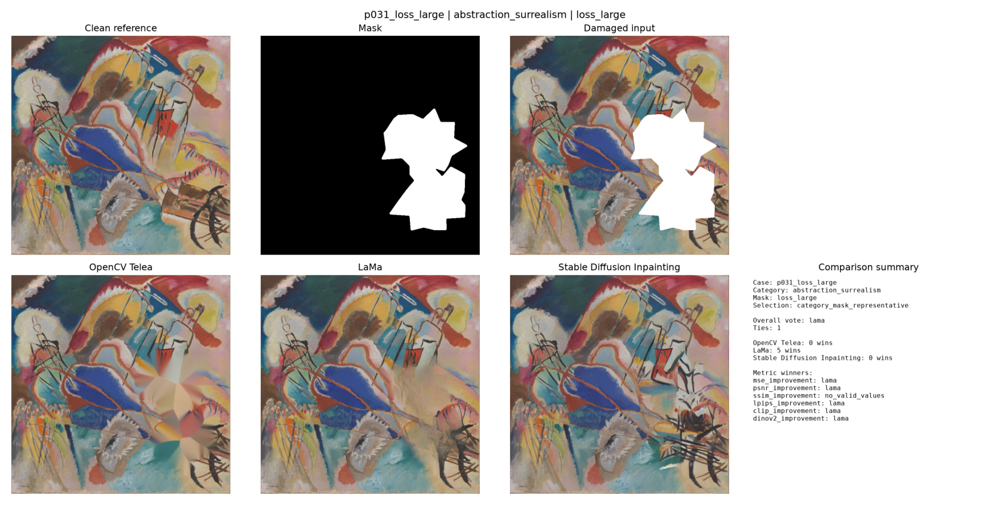

Displaying p030_loss_large | architecture_structured | loss_large | category_mask_representative; majority_vote_lama


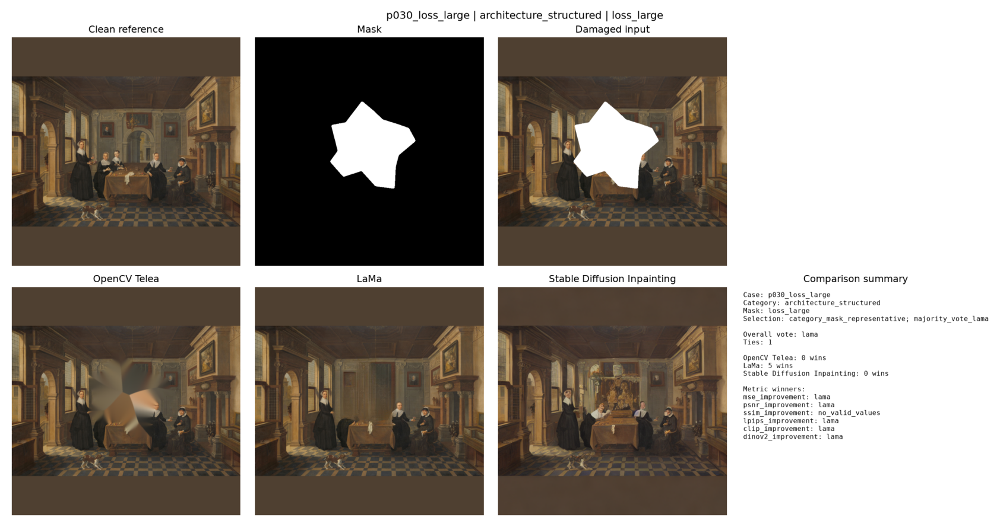

Displaying p001_loss_large | portrait_figure | loss_large | category_mask_representative; majority_vote_lama; stable_diffusion_zero_metric_wins


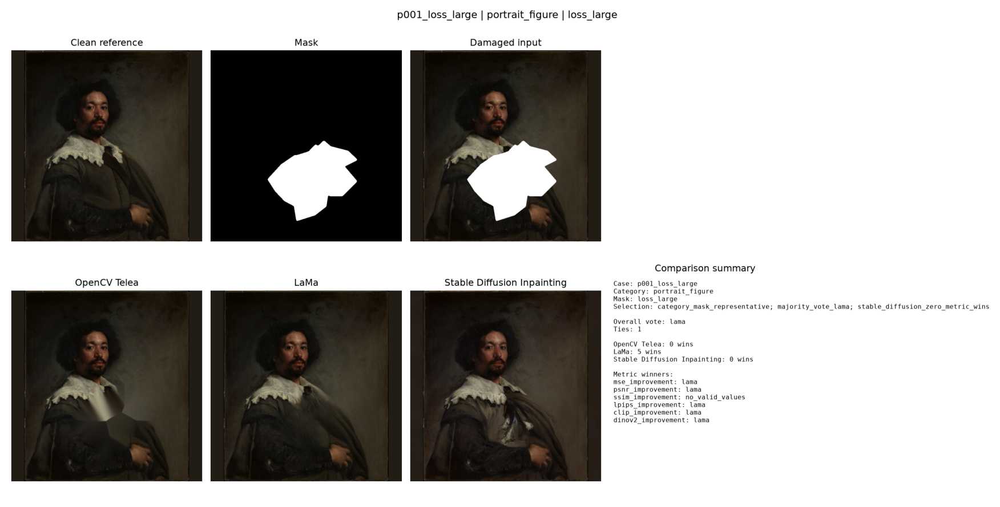

Displaying p030_scratch_thin | architecture_structured | scratch_thin | category_mask_representative; majority_vote_opencv_telea


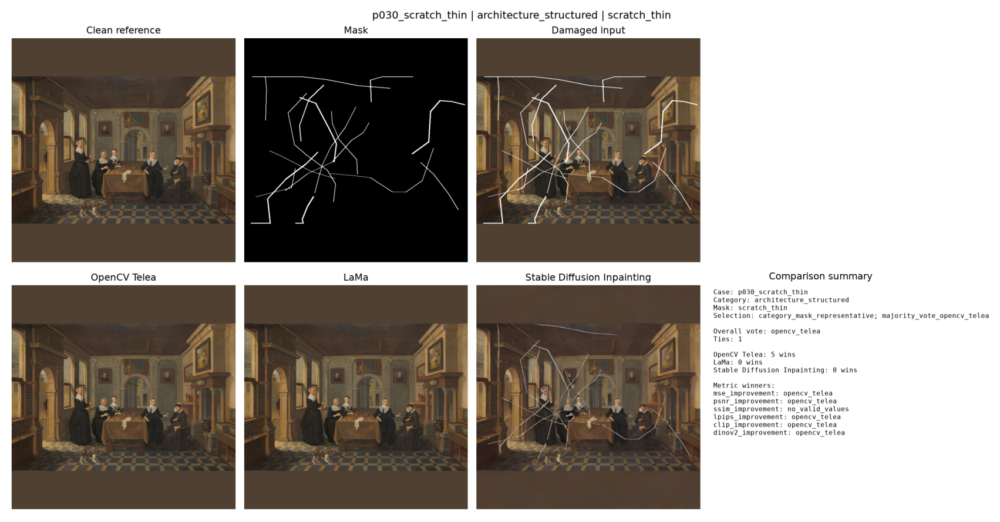

Displaying p001_loss_small | portrait_figure | loss_small | category_mask_representative; stable_diffusion_zero_metric_wins


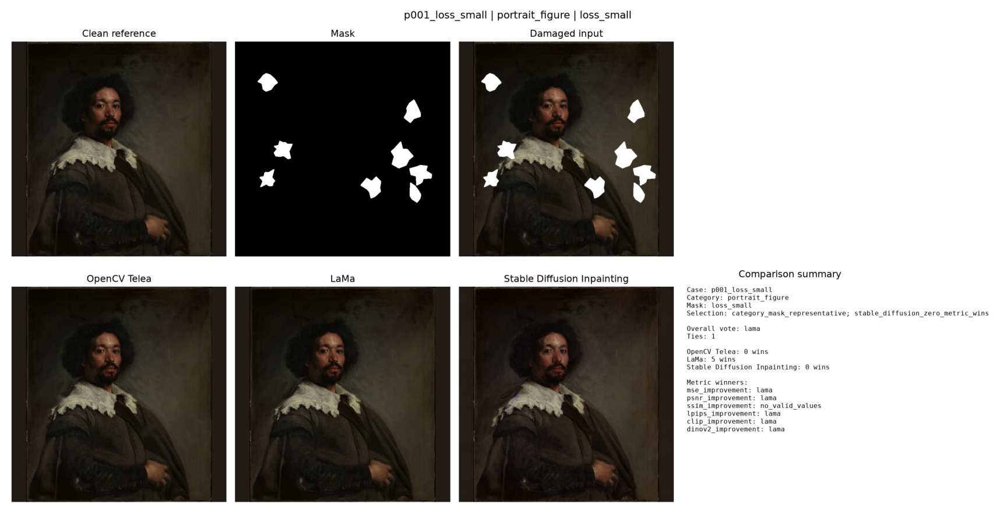

Displaying p032_loss_small | abstraction_surrealism | loss_small | majority_vote_lama


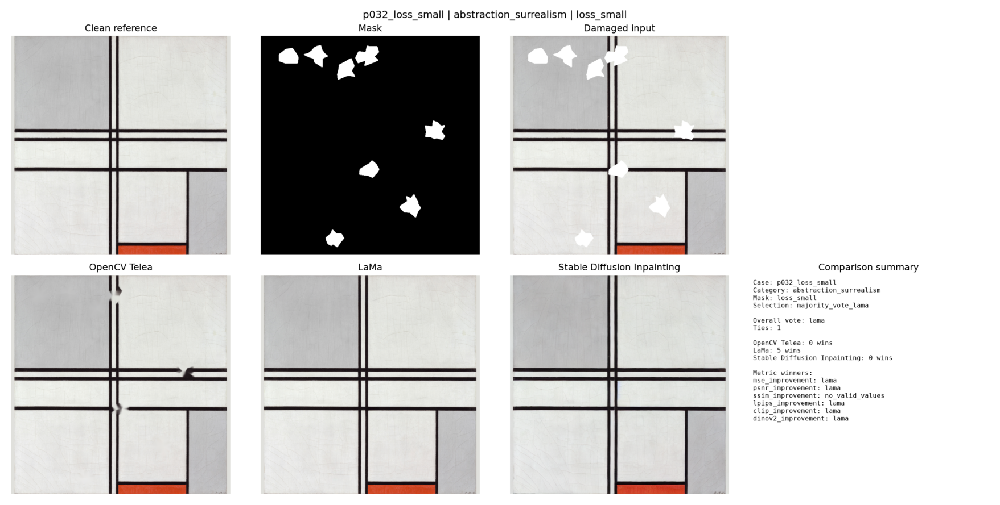

Displaying p037_scratch_thin | abstraction_surrealism | scratch_thin | majority_vote_opencv_telea


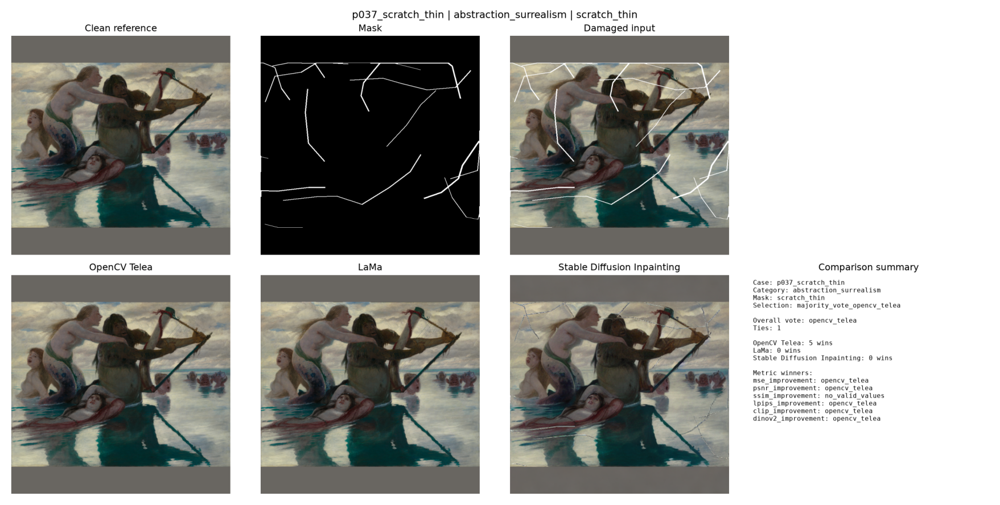

Displaying p037_loss_large | abstraction_surrealism | loss_large | majority_vote_stable_diffusion_inpainting


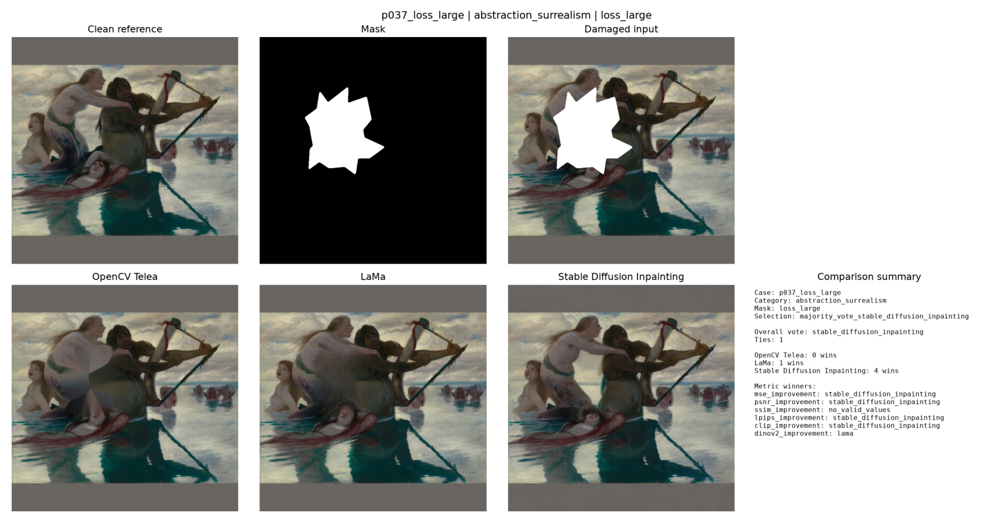

Displaying p040_loss_large | abstraction_surrealism | loss_large | metric_disagreement


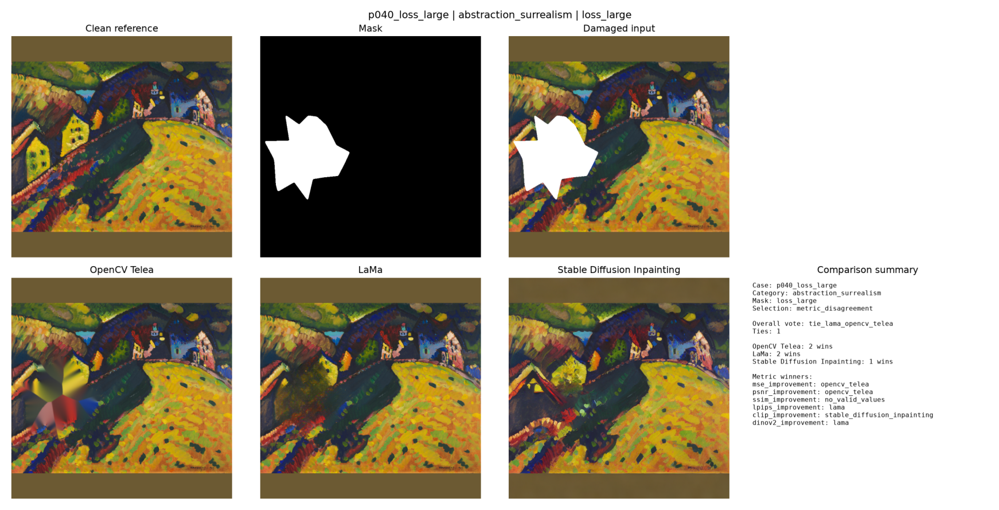

Displaying p001_mixed_damage | portrait_figure | mixed_damage | metric_disagreement; stable_diffusion_zero_metric_wins


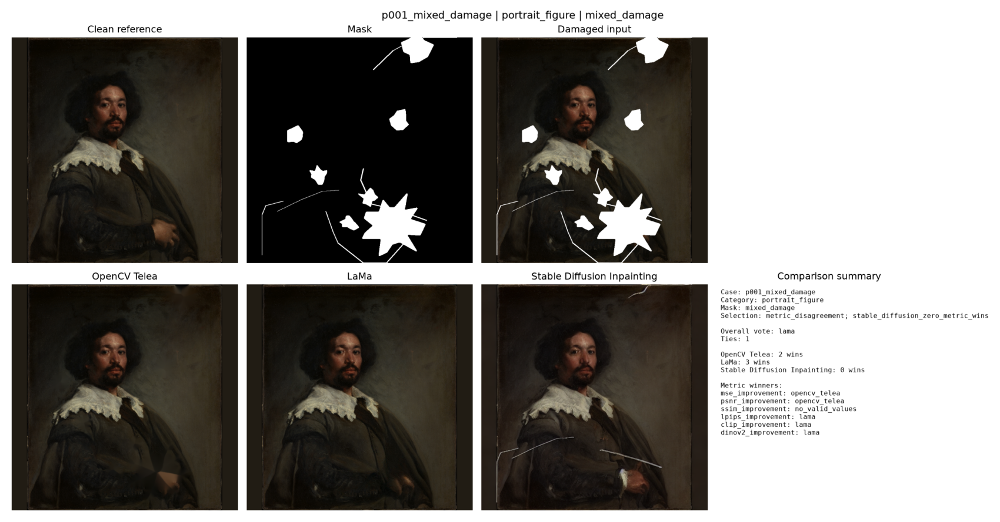

Displaying p002_loss_large | portrait_figure | loss_large | stable_diffusion_zero_metric_wins


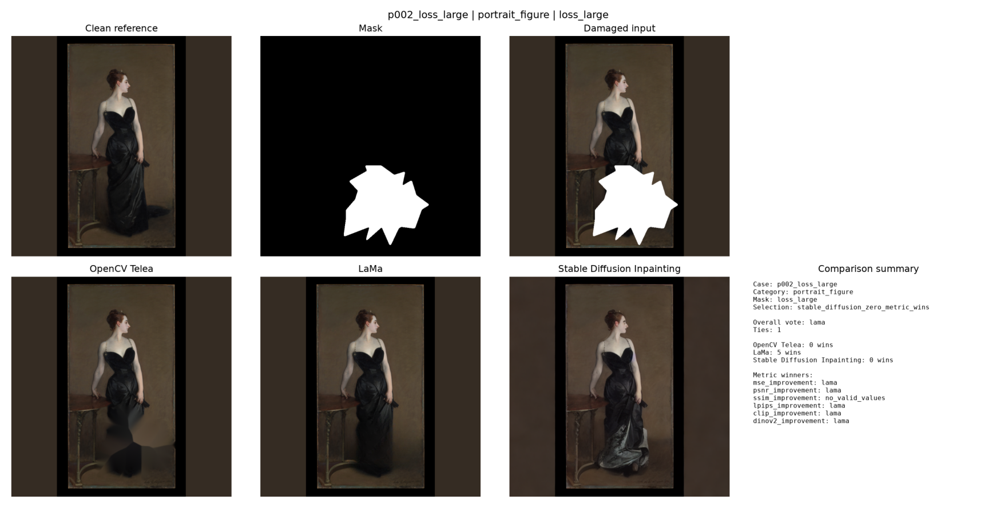

In [23]:
def display_comparison_figure(path_value: str | Path) -> None:
    figure_path = resolve_project_path(path_value)

    if not figure_path.exists():
        raise FileNotFoundError(f"Missing comparison figure: {figure_path}")

    image = Image.open(figure_path).convert("RGB")

    plt.figure(figsize=(18, 9))
    plt.imshow(image)
    plt.axis("off")
    plt.tight_layout()
    plt.show()


sample_comparison_figures_df = (
    visual_cases_with_paths_df
    .sort_values(["selection_reason", "category", "mask_type", "case_id"])
    .groupby("selection_reason", dropna=False)
    .head(1)
    .copy()
)

print("Displaying sample comparison figures:", len(sample_comparison_figures_df))

display(
    sample_comparison_figures_df[
        [
            "case_id",
            "category",
            "mask_type",
            "selection_reason",
            "overall_metric_vote",
            "comparison_figure_path",
        ]
    ]
)

for _, row in sample_comparison_figures_df.iterrows():
    print(
        f"Displaying {row['case_id']} | "
        f"{row['category']} | {row['mask_type']} | "
        f"{row['selection_reason']}"
    )
    display_comparison_figure(row["comparison_figure_path"])

In [24]:
def dataframe_to_html_table(
    df: pd.DataFrame,
    *,
    max_rows: int = 30,
    float_precision: int = 4,
) -> str:
    display_df = df.head(max_rows).copy()

    for column in display_df.select_dtypes(include=["float", "float64", "float32"]).columns:
        display_df[column] = display_df[column].round(float_precision)

    return display_df.to_html(index=False, escape=True, classes="data-table")


def image_to_base64_data_uri(path_value: str | Path, *, max_width: int = 1500) -> str:
    path = resolve_project_path(path_value)

    if not path.exists():
        raise FileNotFoundError(f"Missing image for report embedding: {path}")

    image = Image.open(path).convert("RGB")

    if image.width > max_width:
        scale = max_width / image.width
        new_size = (max_width, int(image.height * scale))
        image = image.resize(new_size)

    from io import BytesIO

    buffer = BytesIO()
    image.save(buffer, format="PNG")
    encoded = base64.b64encode(buffer.getvalue()).decode("utf-8")

    return f"data:image/png;base64,{encoded}"


def render_metric_card(title: str, value: str, subtitle: str = "") -> str:
    return f"""
    <div class="metric-card">
        <div class="metric-title">{title}</div>
        <div class="metric-value">{value}</div>
        <div class="metric-subtitle">{subtitle}</div>
    </div>
    """


def render_comparison_gallery(
    df: pd.DataFrame,
    *,
    max_items: int = 12,
) -> str:
    gallery_items = []

    for _, row in df.head(max_items).iterrows():
        image_uri = image_to_base64_data_uri(
            row["comparison_figure_path"],
            max_width=1500,
        )

        gallery_items.append(
            f"""
            <div class="visual-item">
                <h4>{row['case_id']} | {row['category']} | {row['mask_type']}</h4>
                <p><strong>Selection:</strong> {row['selection_reason']}</p>
                <p><strong>Overall vote:</strong> {row['overall_metric_vote']}</p>
                <img src="{image_uri}" alt="{row['case_id']}">
            </div>
            """
        )

    return f"""
    <section>
        <h2>Selected visual comparison cases</h2>
        <div class="visual-gallery">
            {''.join(gallery_items)}
        </div>
    </section>
    """


print("HTML helpers ready.")

HTML helpers ready.


In [25]:
generated_at = datetime.now().strftime("%Y-%m-%d %H:%M:%S")

model_cards_html = "".join(
    [
        render_metric_card(
            model_registry[model_name]["display_name"],
            str(int(comparison_df[f"{model_name}_metric_wins"].sum())),
            "Total metric wins across 200 local cases × 6 metrics",
        )
        for model_name in model_names
    ]
)

overview_cards_html = "".join(
    [
        render_metric_card(
            "Paired cases",
            str(len(wide_pairing_df)),
            "Includes zero controls",
        ),
        render_metric_card(
            "Local comparison cases",
            str(len(comparison_df)),
            "Non-zero damage cases",
        ),
        render_metric_card(
            "Metrics per case",
            str(len(comparison_metrics)),
            "MSE, PSNR, SSIM, LPIPS, CLIP, DINOv2",
        ),
        render_metric_card(
            "Visual comparison cases",
            str(len(visual_cases_with_paths_df)),
            "Fixed diagnostic selection policy",
        ),
        render_metric_card(
            "Metric-disagreement cases",
            str(len(metric_disagreement_cases_df)),
            "Cases where metrics disagree",
        ),
    ]
)

winner_tables_html = f"""
<section>
    <h2>Win-rate summary</h2>
    <p>Each local case is evaluated across six metrics. Higher improvement is treated as better for all metrics.</p>
    {dataframe_to_html_table(win_rates_df, max_rows=100)}
</section>
"""

summary_tables_html = f"""
<section>
    <h2>Summary by mask type</h2>
    {dataframe_to_html_table(summary_by_mask_type_df, max_rows=20)}
</section>

<section>
    <h2>Summary by painting category</h2>
    {dataframe_to_html_table(summary_by_category_df, max_rows=20)}
</section>
"""

disagreement_html = f"""
<section>
    <h2>Metric-disagreement cases</h2>
    <p>These cases show disagreement between metric families or model winners. They are important because restoration quality is not reducible to one score, despite humanity's persistent attempts to rank everything with one number.</p>
    {dataframe_to_html_table(
        metric_disagreement_cases_df[
            [
                "case_id",
                "category",
                "mask_type",
                "overall_metric_vote",
                "num_unique_metric_winners",
                "disagreement_strength",
                *winner_columns,
                *[f"{model_name}_metric_wins" for model_name in model_names],
                "metric_ties",
            ]
        ],
        max_rows=40,
    )}
</section>
"""

visual_gallery_html = render_comparison_gallery(
    visual_cases_with_paths_df,
    max_items=16,
)

html_report = f"""
<!DOCTYPE html>
<html lang="en">
<head>
<meta charset="utf-8">
<title>OpenCV vs LaMa vs Stable Diffusion Comparison Report</title>
<style>
body {{
    font-family: Arial, sans-serif;
    margin: 32px;
    background: #f7f7f7;
    color: #222;
}}
h1, h2, h3 {{
    color: #111;
}}
section {{
    background: white;
    padding: 20px;
    margin: 24px 0;
    border-radius: 10px;
    box-shadow: 0 1px 4px rgba(0,0,0,0.12);
}}
.metric-grid {{
    display: grid;
    grid-template-columns: repeat(auto-fit, minmax(230px, 1fr));
    gap: 14px;
    margin: 20px 0;
}}
.metric-card {{
    background: #ffffff;
    border-left: 5px solid #444;
    padding: 14px;
    border-radius: 8px;
    box-shadow: 0 1px 4px rgba(0,0,0,0.12);
}}
.metric-title {{
    font-size: 13px;
    color: #666;
    text-transform: uppercase;
}}
.metric-value {{
    font-size: 28px;
    font-weight: bold;
    margin: 8px 0;
}}
.metric-subtitle {{
    font-size: 13px;
    color: #777;
}}
.data-table {{
    border-collapse: collapse;
    width: 100%;
    margin: 12px 0 24px 0;
    font-size: 12px;
}}
.data-table th, .data-table td {{
    border: 1px solid #ddd;
    padding: 6px;
    text-align: left;
}}
.data-table th {{
    background: #efefef;
}}
.visual-gallery {{
    display: flex;
    flex-direction: column;
    gap: 24px;
}}
.visual-item {{
    border-top: 1px solid #ddd;
    padding-top: 16px;
}}
.visual-item img {{
    max-width: 100%;
    height: auto;
    border: 1px solid #ccc;
}}
.warning {{
    background: #fff7e6;
    border-left: 5px solid #cc8800;
    padding: 14px;
    border-radius: 8px;
}}
</style>
</head>
<body>

<h1>OpenCV Telea vs LaMa vs Stable Diffusion Comparison Report</h1>
<p><strong>Generated:</strong> {generated_at}</p>

<section>
    <h2>Report purpose</h2>
    <p>This report compares three completed restoration baselines on the controlled 50-painting subset: OpenCV Telea, LaMa, and Stable Diffusion Inpainting.</p>
    <p>The local comparison uses classical metrics on the sparse masked region, and LPIPS/CLIP/DINOv2 on the mask-bounding-box crop.</p>
    <div class="warning">
        Stable Diffusion is generative. Model wins in this report should be interpreted as metric behavior, not as proof of conservation or art-historical correctness.
    </div>
</section>

<section>
    <h2>Overview</h2>
    <div class="metric-grid">
        {overview_cards_html}
    </div>
</section>

<section>
    <h2>Total metric wins by model</h2>
    <div class="metric-grid">
        {model_cards_html}
    </div>
</section>

{winner_tables_html}
{summary_tables_html}
{disagreement_html}
{visual_gallery_html}

<section>
    <h2>Interpretation notes</h2>
    <ul>
        <li>The comparison uses 200 non-zero damage cases.</li>
        <li>Each case has six local metrics: MSE, PSNR, SSIM, LPIPS, CLIP, and DINOv2 improvement.</li>
        <li>Classical metrics use the masked region.</li>
        <li>LPIPS and feature-space metrics use the mask-bounding-box crop.</li>
        <li>Metric disagreement is expected and is treated as useful diagnostic evidence.</li>
        <li>Visual plausibility and restoration faithfulness remain separate concerns.</li>
    </ul>
</section>

</body>
</html>
"""

comparison_report_path.write_text(html_report, encoding="utf-8")

print("Saved three-model comparison report:")
print(comparison_report_path)

Saved three-model comparison report:
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_lama_stable_diffusion_comparison_report_50.html


In [26]:
expected_comparison_files = [
    output_paths["pairing"],
    output_paths["classical_comparison"],
    output_paths["lpips_comparison"],
    output_paths["feature_comparison"],
    output_paths["unified_local_comparison"],
    output_paths["summary_by_mask_type"],
    output_paths["summary_by_category"],
    output_paths["win_rates"],
    output_paths["metric_disagreement_cases"],
    output_paths["visual_cases"],
    comparison_report_path,
]

for output_file in expected_comparison_files:
    if not output_file.exists():
        raise FileNotFoundError(
            f"Missing expected three-model comparison output: {output_file}"
        )

saved_pairing_df = pd.read_csv(output_paths["pairing"])
saved_classical_comparison_df = pd.read_csv(output_paths["classical_comparison"])
saved_lpips_comparison_df = pd.read_csv(output_paths["lpips_comparison"])
saved_feature_comparison_df = pd.read_csv(output_paths["feature_comparison"])
saved_unified_df = pd.read_csv(output_paths["unified_local_comparison"])
saved_summary_by_mask_type_df = pd.read_csv(output_paths["summary_by_mask_type"])
saved_summary_by_category_df = pd.read_csv(output_paths["summary_by_category"])
saved_win_rates_df = pd.read_csv(output_paths["win_rates"])
saved_metric_disagreement_df = pd.read_csv(output_paths["metric_disagreement_cases"])
saved_visual_cases_df = pd.read_csv(output_paths["visual_cases"])

if len(saved_pairing_df) != 250:
    raise ValueError(
        f"Expected 250 paired cases, found {len(saved_pairing_df)}."
    )

if len(saved_unified_df) != 200:
    raise ValueError(
        f"Expected 200 unified local comparison rows, found {len(saved_unified_df)}."
    )

for name, df in {
    "classical_comparison": saved_classical_comparison_df,
    "lpips_comparison": saved_lpips_comparison_df,
    "feature_comparison": saved_feature_comparison_df,
}.items():
    if len(df) != 200:
        raise ValueError(
            f"Expected 200 rows for {name}, found {len(df)}."
        )

if len(saved_summary_by_mask_type_df) != 4:
    raise ValueError(
        f"Expected 4 mask-type summary rows, found {len(saved_summary_by_mask_type_df)}."
    )

if len(saved_summary_by_category_df) != 5:
    raise ValueError(
        f"Expected 5 category summary rows, found {len(saved_summary_by_category_df)}."
    )

if len(saved_win_rates_df) == 0:
    raise ValueError("Saved win-rate table is empty.")

if len(saved_visual_cases_df) == 0:
    raise ValueError("Saved visual comparison cases table is empty.")

required_unified_columns = [
    "case_id",
    "painting_id",
    "mask_id",
    "mask_type",
    "category",
    "title",
    "overall_metric_vote",
    "metric_ties",
    "mixed_metric_outcome",
]

for model_name in model_names:
    required_unified_columns.extend(
        [
            f"{model_name}_metric_wins",
            f"{model_name}_mse_improvement",
            f"{model_name}_psnr_improvement",
            f"{model_name}_ssim_improvement",
            f"{model_name}_lpips_improvement",
            f"{model_name}_clip_improvement",
            f"{model_name}_dinov2_improvement",
        ]
    )

for metric_name in comparison_metrics:
    required_unified_columns.append(f"winner_{metric_name}")

missing_unified_columns = [
    column for column in required_unified_columns
    if column not in saved_unified_df.columns
]

if missing_unified_columns:
    raise ValueError(
        f"Saved unified comparison missing columns: {missing_unified_columns}"
    )

expected_mask_counts = {
    "loss_large": 50,
    "loss_small": 50,
    "mixed_damage": 50,
    "scratch_thin": 50,
}

actual_mask_counts = saved_unified_df["mask_type"].value_counts().to_dict()

print("Expected non-zero mask counts:", expected_mask_counts)
print("Actual non-zero mask counts:", actual_mask_counts)

for mask_type, expected_count in expected_mask_counts.items():
    actual_count = actual_mask_counts.get(mask_type, 0)

    if actual_count != expected_count:
        raise ValueError(
            f"Unified comparison mask type {mask_type!r}: "
            f"expected {expected_count}, found {actual_count}."
        )

if "zero_control" in actual_mask_counts:
    raise ValueError("Unified local comparison should not include zero_control rows.")

expected_category_counts = {
    "portrait_figure": 40,
    "landscape_natural": 40,
    "architecture_structured": 40,
    "abstraction_surrealism": 40,
    "high_texture_brushwork": 40,
}

actual_category_counts = saved_unified_df["category"].value_counts().to_dict()

print("\nExpected category counts:", expected_category_counts)
print("Actual category counts:", actual_category_counts)

for category, expected_count in expected_category_counts.items():
    actual_count = actual_category_counts.get(category, 0)

    if actual_count != expected_count:
        raise ValueError(
            f"Unified comparison category {category!r}: "
            f"expected {expected_count}, found {actual_count}."
        )

allowed_winners = set(model_names)
allowed_winner_prefixes = {"tie_", "tie_all", "no_valid_values"}

for metric_name in comparison_metrics:
    winner_column = f"winner_{metric_name}"

    invalid_winners = []

    for winner_value in saved_unified_df[winner_column].dropna().astype(str).unique():
        if winner_value in allowed_winners:
            continue

        if winner_value in allowed_winner_prefixes:
            continue

        if winner_value.startswith("tie_"):
            continue

        invalid_winners.append(winner_value)

    if invalid_winners:
        raise ValueError(
            f"Invalid winner values in {winner_column}: {invalid_winners}"
        )

required_visual_columns = [
    "case_id",
    "painting_id",
    "mask_id",
    "mask_type",
    "category",
    "selection_reason",
    "overall_metric_vote",
    "comparison_figure_path",
]

missing_visual_columns = [
    column for column in required_visual_columns
    if column not in saved_visual_cases_df.columns
]

if missing_visual_columns:
    raise ValueError(
        f"Saved visual comparison cases missing columns: {missing_visual_columns}"
    )

missing_comparison_figures = [
    path
    for path in saved_visual_cases_df["comparison_figure_path"]
    if str(path).strip() == "" or not Path(path).exists()
]

if missing_comparison_figures:
    raise FileNotFoundError(
        f"Saved visual comparison cases reference missing figures: "
        f"{missing_comparison_figures[:10]}"
    )

expected_selection_fragments = [
    "metric_disagreement",
    "category_mask_representative",
]

selection_reason_text = " ".join(
    saved_visual_cases_df["selection_reason"].fillna("").astype(str).tolist()
)

missing_selection_fragments = [
    fragment
    for fragment in expected_selection_fragments
    if fragment not in selection_reason_text
]

if missing_selection_fragments:
    raise ValueError(
        f"Missing expected visual selection fragments: {missing_selection_fragments}"
    )

html_content = comparison_report_path.read_text(encoding="utf-8")

required_html_phrases = [
    "OpenCV Telea vs LaMa vs Stable Diffusion Comparison Report",
    "Win-rate summary",
    "Metric-disagreement cases",
    "Selected visual comparison cases",
    "Stable Diffusion is generative",
]

missing_html_phrases = [
    phrase
    for phrase in required_html_phrases
    if phrase not in html_content
]

if missing_html_phrases:
    raise ValueError(
        f"Comparison HTML report missing expected phrases: {missing_html_phrases}"
    )

if len(html_content) < 10_000:
    raise ValueError(
        f"Comparison HTML report seems too small: {len(html_content)} characters."
    )

print("\nSaved pairing rows:", len(saved_pairing_df))
print("Saved unified local rows:", len(saved_unified_df))
print("Saved visual comparison rows:", len(saved_visual_cases_df))
print("Saved metric-disagreement rows:", len(saved_metric_disagreement_df))
print("Comparison report path:", comparison_report_path)
print("Comparison report characters:", len(html_content))
print("Final three-model comparison output gates passed.")

Expected non-zero mask counts: {'loss_large': 50, 'loss_small': 50, 'mixed_damage': 50, 'scratch_thin': 50}
Actual non-zero mask counts: {'loss_large': 50, 'loss_small': 50, 'mixed_damage': 50, 'scratch_thin': 50}

Expected category counts: {'portrait_figure': 40, 'landscape_natural': 40, 'architecture_structured': 40, 'abstraction_surrealism': 40, 'high_texture_brushwork': 40}
Actual category counts: {'portrait_figure': 40, 'landscape_natural': 40, 'architecture_structured': 40, 'abstraction_surrealism': 40, 'high_texture_brushwork': 40}

Saved pairing rows: 250
Saved unified local rows: 200
Saved visual comparison rows: 43
Saved metric-disagreement rows: 200
Comparison report path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\reports\opencv_lama_stable_diffusion_comparison_report_50.html
Comparison report characters: 17962911
Final three-model comparison output gates passed.


## Notebook 24 summary

This notebook compared the three completed restoration baselines on the controlled 50-painting subset:

- OpenCV Telea,
- LaMa,
- Stable Diffusion Inpainting.

The comparison was case-paired across all models using:

- `case_id`,
- `painting_id`,
- `mask_id`,
- `mask_type`.

The local comparison used 200 non-zero damage cases.

Metric regions:

- classical metrics: `masked_region`,
- LPIPS: `mask_bbox_crop`,
- CLIP/DINOv2 feature similarity: `mask_bbox_crop`.

The six local comparison metrics were:

- MSE improvement,
- PSNR improvement,
- SSIM improvement,
- LPIPS improvement,
- CLIP similarity improvement,
- DINOv2 similarity improvement.

Main outputs:

- `outputs/metrics/model_pairing_opencv_lama_stable_diffusion_50.csv`
- `outputs/metrics/comparison_classical_opencv_lama_stable_diffusion_50.csv`
- `outputs/metrics/comparison_lpips_opencv_lama_stable_diffusion_50.csv`
- `outputs/metrics/comparison_feature_similarity_opencv_lama_stable_diffusion_50.csv`
- `outputs/metrics/comparison_unified_opencv_lama_stable_diffusion_50.csv`
- `outputs/metrics/comparison_summary_by_mask_type_opencv_lama_stable_diffusion_50.csv`
- `outputs/metrics/comparison_summary_by_category_opencv_lama_stable_diffusion_50.csv`
- `outputs/metrics/comparison_win_rates_opencv_lama_stable_diffusion_50.csv`
- `outputs/metrics/comparison_metric_disagreement_cases_opencv_lama_stable_diffusion_50.csv`
- `outputs/metrics/comparison_visual_cases_opencv_lama_stable_diffusion_50.csv`
- `outputs/figures/model_comparison/opencv_lama_stable_diffusion/`
- `outputs/reports/opencv_lama_stable_diffusion_comparison_report_50.html`

The notebook generated metric-wise winners, per-case majority votes, mask/category summaries, metric-disagreement cases, selected visual comparison figures, and an embedded HTML comparison report.

This stage completes the first three-model comparison and prepares the project for the SDXL branch and later diffusion uncertainty analysis.